In [1]:
import os
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
import yaml
import cv2
from PIL import Image
import torch
import torch.nn.functional as F
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import roc_curve, auc, precision_recall_curve
import warnings
warnings.filterwarnings('ignore')

# Setup paths
project_root = Path.cwd().parent if 'notebooks' in str(Path.cwd()) else Path.cwd()
src_path = project_root / 'src'
sys.path.append(str(src_path))

# Import custom modules
from models.unet import create_model
from datasets.fire_dataset import FireDataModule
from losses.dice_focal import create_loss_function
from train.metrics import FireDetectionMetrics

print("Environment setup complete!")
print(f"Project root: {project_root}")
print(f"GPU available: {torch.cuda.is_available()}")

Successfully imported TileInfo and TileDataset from preprocessing.tiling
Environment setup complete!
Project root: e:\Forest_V11\Forest-Fire-Detection-And-Spread-Prediction
GPU available: True


In [2]:
with open(project_root / 'configs/model.yaml', 'r') as f:
    model_config = yaml.safe_load(f)

with open(project_root / 'configs/data.yaml', 'r') as f:
    data_config = yaml.safe_load(f)

print("Configurations loaded successfully")

# Create model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = create_model(model_config['model'])
model = model.to(device)

# Load best checkpoint
checkpoint_path = project_root / 'checkpoints' / 'best_checkpoint.pth'
if checkpoint_path.exists():
    checkpoint = torch.load(checkpoint_path, map_location=device)
    model.load_state_dict(checkpoint['model_state_dict'])
    print(f"Loaded best checkpoint from epoch {checkpoint.get('epoch', 'unknown')}")
else:
    print("Warning: Best checkpoint not found, using initialized model")

model.eval()

Configurations loaded successfully
Loaded best checkpoint from epoch 56


UNet(
  (encoder): PretrainedEncoder(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
      (1): BasicBlock(
        (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, t

In [3]:
import os
import numpy as np
from PIL import Image

# --- Data module config ---
data_module_config = {
    'data_root': 'data/interim/tiles',
    'batch_size': 8,
    'image_size': data_config['data'].get('tile_size', 512),
    'val_split': data_config['data'].get('val_ratio', 0.2),
    'test_split': data_config['data'].get('test_ratio', 0.1),
    'num_workers': 2,
    'use_weighted_sampling': False,
    'task': 'segmentation',
    'augmentation': {'enabled': False}
}

# --- Ensure dataset exists ---
images_dir = os.path.join(data_module_config['data_root'], "images")
masks_dir = os.path.join(data_module_config['data_root'], "masks")

os.makedirs(images_dir, exist_ok=True)
os.makedirs(masks_dir, exist_ok=True)


# --- Create data module ---
data_module = FireDataModule(
    tiles_dir=data_module_config['data_root'],
    batch_size=data_module_config['batch_size'],
    num_workers=data_module_config['num_workers'],
    val_split=data_module_config['val_split'],
    test_split=data_module_config['test_split'],
    image_size=data_module_config['image_size'],
    use_weighted_sampling=data_module_config['use_weighted_sampling'],
    task=data_module_config['task'],
    augmentation_config=data_module_config['augmentation']
)

# --- Get data loaders ---
test_loader = data_module.test_dataloader()
val_loader = data_module.val_dataloader()

print(f"Test batches: {len(test_loader)}")
print(f"Validation batches: {len(val_loader)}")


Image not found: data\interim\tiles\images\Ontario-2023-06-17_r000_c004.png
Image not found: data\interim\tiles\images\BritishColumbia-2023-06-14_r005_c006.png
Image not found: data\interim\tiles\images\Quebec-2023-06-23_r009_c007.png
Image not found: data\interim\tiles\images\BritishColumbia-2023-06-27_r005_c006.png
Image not found: data\interim\tiles\images\BritishColumbia-2023-06-09_r000_c002.png
Image not found: data\interim\tiles\images\BritishColumbia-2023-06-19_r005_c003.png
Image not found: data\interim\tiles\images\Quebec-2023-06-21_r004_c002.png
Image not found: data\interim\tiles\images\Quebec-2023-06-12_r008_c006.png
Image not found: data\interim\tiles\images\BritishColumbia-2023-06-07_r004_c007.png
Image not found: data\interim\tiles\images\Alberta-2023-06-07_r002_c002.png
Image not found: data\interim\tiles\images\Quebec-2023-06-27_r001_c000.png
Image not found: data\interim\tiles\images\Ontario-2023-06-03_r000_c006.png
Image not found: data\interim\tiles\images\Quebec-20

Fire distribution - Train: 1190/5467 (21.8%), Val: 238/1094 (21.8%)


Image not found: data\interim\tiles\images\Ontario-2023-06-10_r000_c006.png
Image not found: data\interim\tiles\images\Alberta-2023-06-13_r003_c003.png
Image not found: data\interim\tiles\images\Quebec-2023-06-17_r005_c006.png
Image not found: data\interim\tiles\images\Quebec-2023-06-18_r004_c000.png
Image not found: data\interim\tiles\images\Ontario-2023-06-03_r008_c005.png
Image not found: data\interim\tiles\images\Alberta-2023-06-24_r004_c001.png
Image not found: data\interim\tiles\images\Ontario-2023-06-08_r005_c004.png
Image not found: data\interim\tiles\images\BritishColumbia-2023-06-22_r006_c007.png
Image not found: data\interim\tiles\images\Ontario-2023-06-09_r000_c002.png
Image not found: data\interim\tiles\images\Quebec-2023-06-24_r008_c000.png
Image not found: data\interim\tiles\images\Quebec-2023-06-19_r000_c005.png
Image not found: data\interim\tiles\images\Ontario-2023-06-10_r003_c002.png
Image not found: data\interim\tiles\images\Quebec-2023-06-17_r000_c000.png
Image not

Test batches: 20
Validation batches: 30


In [4]:
# ## 3. Model Evaluation Functions

def denormalize_image(tensor):
    """Convert normalized tensor back to displayable image."""
    # Reverse ImageNet normalization
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    
    if tensor.is_cuda:
        mean = mean.cuda()
        std = std.cuda()
    
    img = tensor * std + mean
    img = torch.clamp(img, 0, 1)
    return img

def predict_batch(model, batch, threshold=0.5):
    """Generate predictions for a batch."""
    images, masks = batch
    images = images.to(device)
    masks = masks.to(device)
    
    with torch.no_grad():
        outputs = model(images)
        if isinstance(outputs, dict):
            logits = outputs['out']
        else:
            logits = outputs
        
        # Convert to probabilities
        probs = torch.sigmoid(logits)
        
        # Apply threshold
        preds = (probs > threshold).float()
    
    return {
        'images': images.cpu(),
        'masks': masks.cpu(),
        'logits': logits.cpu(),
        'probs': probs.cpu(),
        'predictions': preds.cpu()
    }

def compute_metrics_on_loader(model, data_loader, threshold=0.5):
    """Compute comprehensive metrics on a data loader."""
    metrics = FireDetectionMetrics(threshold=threshold, device=device)
    
    all_probs = []
    all_targets = []
    
    for batch in data_loader:
        images, masks = batch
        images = images.to(device)
        masks = masks.to(device)
        
        with torch.no_grad():
            outputs = model(images)
            if isinstance(outputs, dict):
                logits = outputs['out']
            else:
                logits = outputs
        
        # Update metrics
        metrics.update(logits, masks)
        
        # Collect for ROC/PR curves
        probs = torch.sigmoid(logits).cpu().flatten()
        targets = masks.cpu().flatten()
        
        # Sample to avoid memory issues
        sample_size = min(1000, len(probs))
        indices = torch.randperm(len(probs))[:sample_size]
        
        all_probs.extend(probs[indices].numpy())
        all_targets.extend(targets[indices].numpy())
    
    final_metrics = metrics.compute_all_metrics()
    
    return final_metrics, np.array(all_probs), np.array(all_targets)

In [5]:
# ## 4. Comprehensive Model Evaluation

print("Evaluating model on test set...")
test_metrics, test_probs, test_targets = compute_metrics_on_loader(model, test_loader)

print("Evaluating model on validation set...")
val_metrics, val_probs, val_targets = compute_metrics_on_loader(model, val_loader)

# Display results
print("\n" + "="*50)
print("MODEL EVALUATION RESULTS")
print("="*50)

print(f"\nTest Set Performance:")
print(f"  Fire F1 Score: {test_metrics.get('fire_f1', 0):.4f}")
print(f"  Mean IoU: {test_metrics.get('mean_iou', 0):.4f}")
print(f"  Fire Precision: {test_metrics.get('fire_precision', 0):.4f}")
print(f"  Fire Recall: {test_metrics.get('fire_detection_rate', 0):.4f}")
print(f"  Pixel Accuracy: {test_metrics.get('pixel_accuracy', 0):.4f}")


print(f"\nValidation Set Performance:")
print(f"  Fire F1 Score: {val_metrics.get('fire_f1', 0):.4f}")
print(f"  Mean IoU: {val_metrics.get('mean_iou', 0):.4f}")
print(f"  Fire Precision: {val_metrics.get('fire_precision', 0):.4f}")
print(f"  Fire Recall: {val_metrics.get('fire_detection_rate', 0):.4f}")
print(f"  Pixel Accuracy: {val_metrics.get('pixel_accuracy', 0):.4f}")


Evaluating model on test set...
Evaluating model on validation set...

MODEL EVALUATION RESULTS

Test Set Performance:
  Fire F1 Score: 0.9580
  Mean IoU: 0.9194
  Fire Precision: 0.9587
  Fire Recall: 0.9573
  Pixel Accuracy: 0.9998

Validation Set Performance:
  Fire F1 Score: 0.9589
  Mean IoU: 0.9211
  Fire Precision: 0.9623
  Fire Recall: 0.9555
  Pixel Accuracy: 0.9998


In [6]:
# ## 5. Visualization Functions

def plot_roc_pr_curves(probs, targets, title_prefix=""):
    """Plot ROC and Precision-Recall curves."""
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))
    
    # ROC Curve
    fpr, tpr, _ = roc_curve(targets, probs)
    roc_auc = auc(fpr, tpr)
    
    ax1.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.3f})')
    ax1.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    ax1.set_xlim([0.0, 1.0])
    ax1.set_ylim([0.0, 1.05])
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('True Positive Rate')
    ax1.set_title(f'{title_prefix}ROC Curve')
    ax1.legend(loc="lower right")
    ax1.grid(True, alpha=0.3)
    
    # Precision-Recall Curve
    precision, recall, _ = precision_recall_curve(targets, probs)
    pr_auc = auc(recall, precision)
    
    ax2.plot(recall, precision, color='darkgreen', lw=2, label=f'PR curve (AUC = {pr_auc:.3f})')
    ax2.set_xlim([0.0, 1.0])
    ax2.set_ylim([0.0, 1.05])
    ax2.set_xlabel('Recall')
    ax2.set_ylabel('Precision')
    ax2.set_title(f'{title_prefix}Precision-Recall Curve')
    ax2.legend(loc="lower left")
    ax2.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

def visualize_predictions(model, data_loader, num_samples=8, threshold=0.5):
    """Visualize model predictions vs ground truth."""
    # Get a batch of samples
    batch = next(iter(data_loader))
    results = predict_batch(model, batch, threshold)
    
    images = results['images']
    masks = results['masks']
    probs = results['probs']
    preds = results['predictions']
    
    num_samples = min(num_samples, len(images))
    
    fig, axes = plt.subplots(num_samples, 4, figsize=(16, 4*num_samples))
    if num_samples == 1:
        axes = axes.reshape(1, -1)
    
    for i in range(num_samples):
        # Original image
        img = denormalize_image(images[i])
        axes[i, 0].imshow(img.permute(1, 2, 0))
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')
        
        # Ground truth mask
        gt_mask = masks[i].squeeze() if masks[i].dim() > 2 else masks[i]
        axes[i, 1].imshow(gt_mask, cmap='Reds', alpha=0.8)
        axes[i, 1].set_title('Ground Truth')
        axes[i, 1].axis('off')
        
        # Prediction probability
        prob_map = probs[i].squeeze() if probs[i].dim() > 2 else probs[i]
        axes[i, 2].imshow(prob_map, cmap='hot', vmin=0, vmax=1)
        axes[i, 2].set_title(f'Probability Map (max: {prob_map.max():.3f})')
        axes[i, 2].axis('off')
        
        # Binary prediction
        pred_mask = preds[i].squeeze() if preds[i].dim() > 2 else preds[i]
        axes[i, 3].imshow(pred_mask, cmap='Reds', alpha=0.8)
        axes[i, 3].set_title(f'Prediction (t={threshold})')
        axes[i, 3].axis('off')
    
    plt.tight_layout()
    plt.show()

def plot_threshold_analysis(model, data_loader, thresholds=np.arange(0.1, 0.9, 0.1)):
    """Analyze performance across different thresholds."""
    results = []
    
    print("Analyzing thresholds...")
    for threshold in thresholds:
        metrics, _, _ = compute_metrics_on_loader(model, data_loader, threshold)
        results.append({
            'threshold': threshold,
            'f1': metrics.get('fire_f1', 0),
            'precision': metrics.get('fire_precision', 0),
            'recall': metrics.get('fire_detection_rate', 0),
            'iou': metrics.get('mean_iou', 0)
        })
        print(f"  Threshold {threshold:.1f}: F1={metrics.get('fire_f1', 0):.3f}")
    
    df = pd.DataFrame(results)
    
    plt.figure(figsize=(12, 8))
    plt.plot(df['threshold'], df['f1'], 'o-', label='F1 Score', linewidth=2)
    plt.plot(df['threshold'], df['precision'], 's-', label='Precision', linewidth=2)
    plt.plot(df['threshold'], df['recall'], '^-', label='Recall', linewidth=2)
    plt.plot(df['threshold'], df['iou'], 'd-', label='IoU', linewidth=2)
    
    plt.xlabel('Threshold')
    plt.ylabel('Score')
    plt.title('Performance vs Threshold')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.ylim(0, 1)
    
    # Mark optimal F1 threshold
    best_idx = df['f1'].idxmax()
    best_threshold = df.iloc[best_idx]['threshold']
    best_f1 = df.iloc[best_idx]['f1']
    plt.axvline(x=best_threshold, color='red', linestyle='--', alpha=0.7)
    plt.text(best_threshold + 0.02, best_f1, f'Best: {best_threshold:.1f}', 
             bbox=dict(boxstyle="round,pad=0.3", facecolor="yellow", alpha=0.7))
    
    plt.show()
    
    return df

def create_overlay_visualization(model, data_loader, num_samples=4):
    """Create overlay visualizations of predictions on original images."""
    batch = next(iter(data_loader))
    results = predict_batch(model, batch, threshold=0.5)
    
    images = results['images']
    masks = results['masks']
    probs = results['probs']
    
    num_samples = min(num_samples, len(images))
    
    fig, axes = plt.subplots(2, num_samples, figsize=(4*num_samples, 8))
    if num_samples == 1:
        axes = axes.reshape(-1, 1)
    
    for i in range(num_samples):
        # Original with ground truth overlay
        img = denormalize_image(images[i]).permute(1, 2, 0).numpy()
        gt_mask = masks[i].squeeze().numpy() if masks[i].dim() > 2 else masks[i].numpy()
        
        axes[0, i].imshow(img)
        axes[0, i].imshow(gt_mask, cmap='Reds', alpha=0.5)
        axes[0, i].set_title('Ground Truth Overlay')
        axes[0, i].axis('off')
        
        # Original with prediction overlay
        prob_map = probs[i].squeeze().numpy() if probs[i].dim() > 2 else probs[i].numpy()
        
        axes[1, i].imshow(img)
        axes[1, i].imshow(prob_map, cmap='hot', alpha=0.6, vmin=0, vmax=1)
        axes[1, i].set_title('Prediction Overlay')
        axes[1, i].axis('off')
    
    plt.tight_layout()
    plt.show()


GENERATING VISUALIZATIONS

1. ROC and Precision-Recall Curves


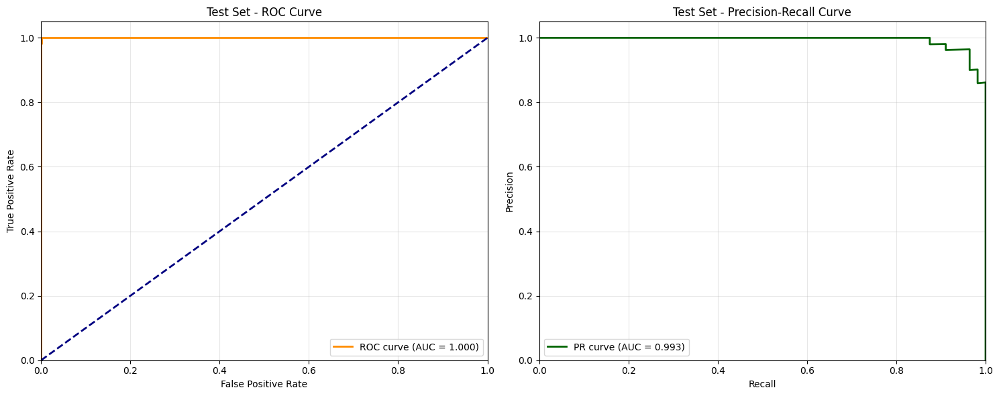

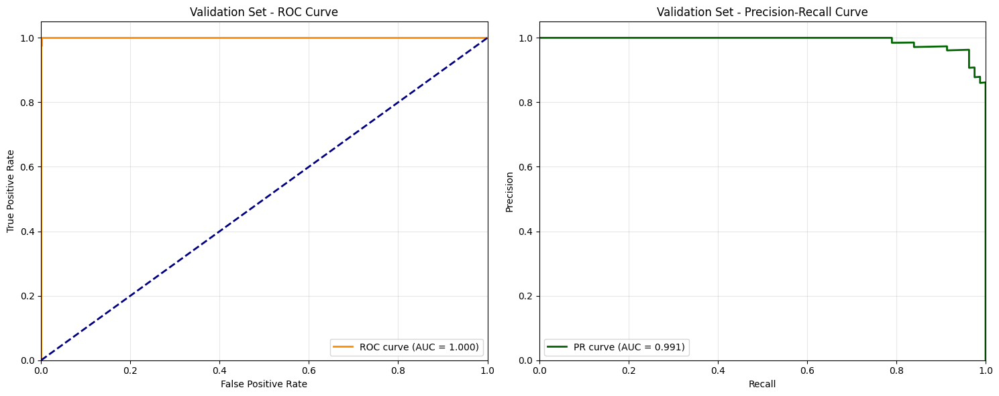


2. Prediction Visualizations
Test Set Predictions:


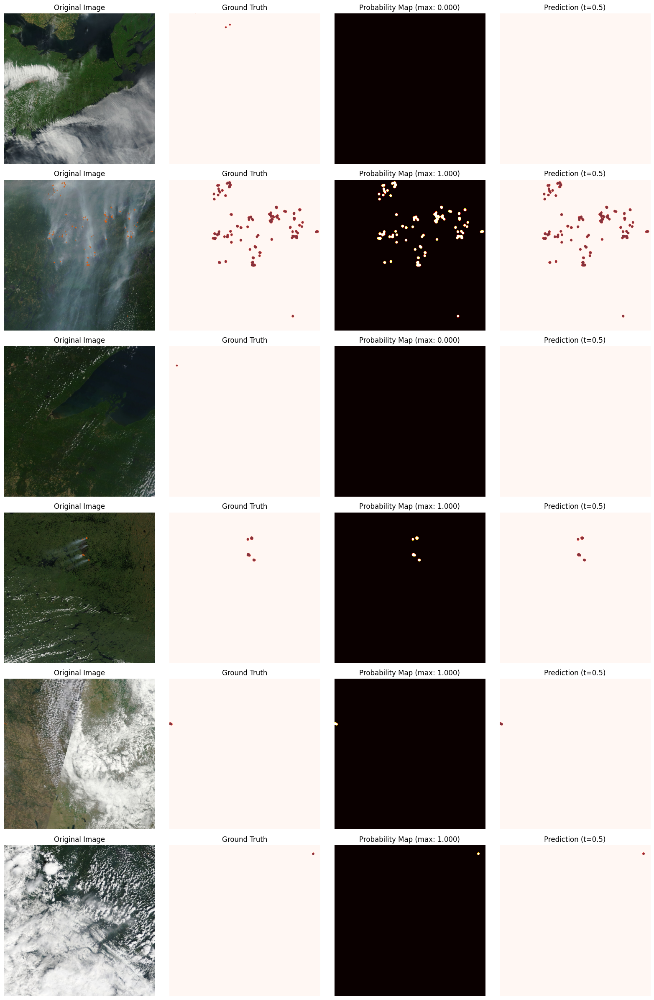

Validation Set Predictions:


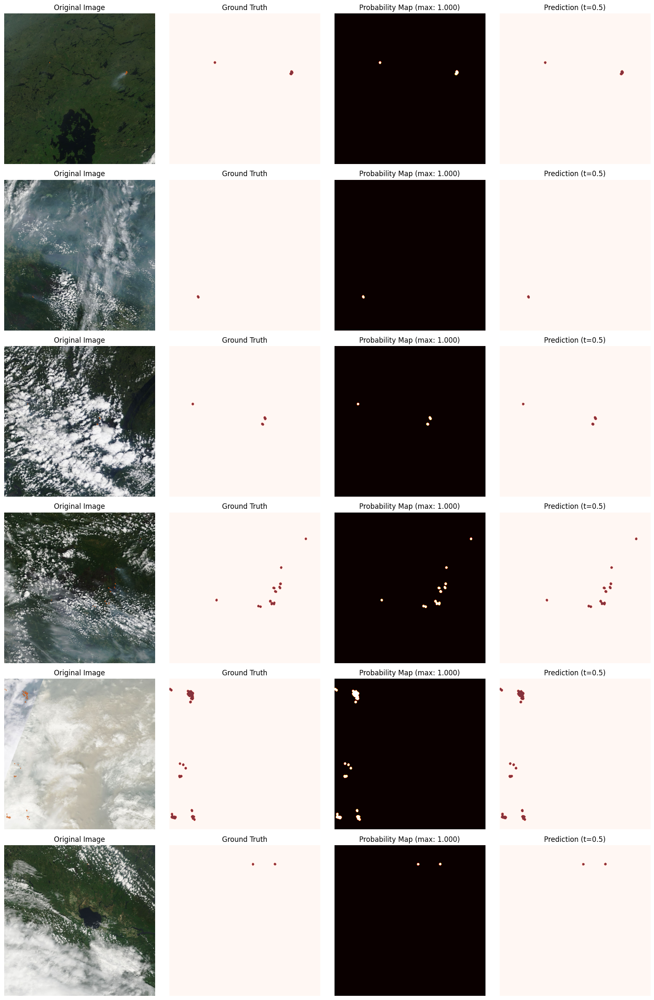


3. Threshold Analysis
Analyzing thresholds...
  Threshold 0.1: F1=0.951
  Threshold 0.2: F1=0.956
  Threshold 0.3: F1=0.957
  Threshold 0.4: F1=0.958
  Threshold 0.5: F1=0.958
  Threshold 0.6: F1=0.957
  Threshold 0.7: F1=0.956
  Threshold 0.8: F1=0.955


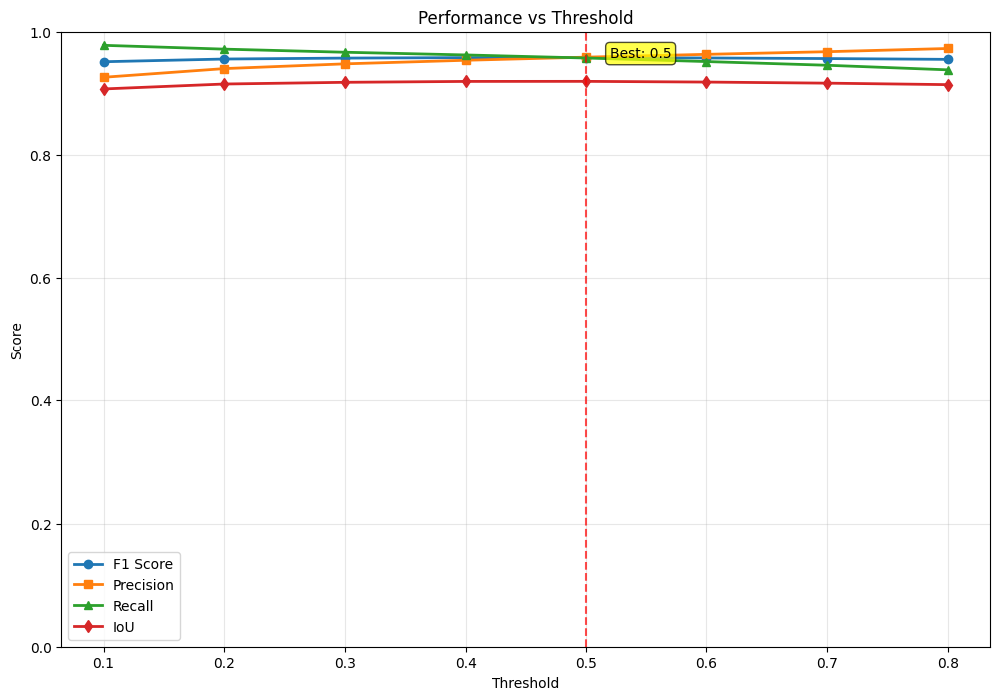


Optimal thresholds:
Best F1: 0.5
Best IoU: 0.5

4. Overlay Visualizations


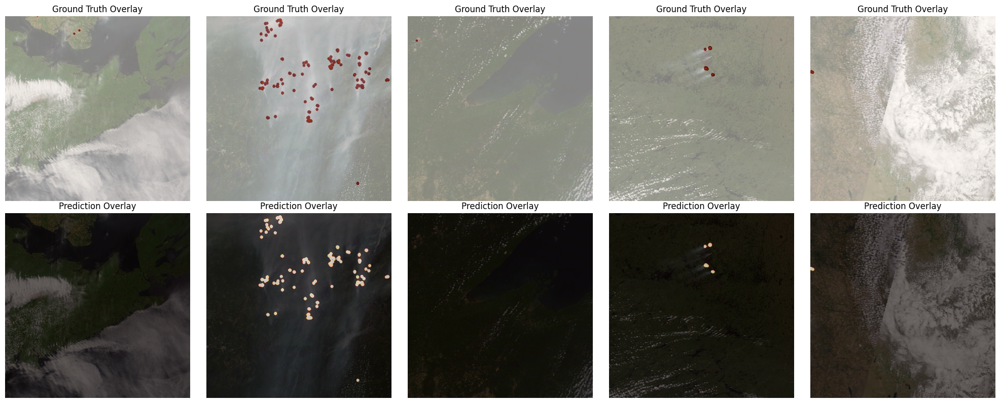

In [7]:
# ## 6. Run Visualizations

print("\n" + "="*50)
print("GENERATING VISUALIZATIONS")
print("="*50)

# Plot ROC and PR curves
print("\n1. ROC and Precision-Recall Curves")
plot_roc_pr_curves(test_probs, test_targets, "Test Set - ")
plot_roc_pr_curves(val_probs, val_targets, "Validation Set - ")

# Visualize predictions
print("\n2. Prediction Visualizations")
print("Test Set Predictions:")
visualize_predictions(model, test_loader, num_samples=6)

print("Validation Set Predictions:")
visualize_predictions(model, val_loader, num_samples=6)

# Threshold analysis
print("\n3. Threshold Analysis")
threshold_df = plot_threshold_analysis(model, test_loader)
print("\nOptimal thresholds:")
print(f"Best F1: {threshold_df.loc[threshold_df['f1'].idxmax(), 'threshold']:.1f}")
print(f"Best IoU: {threshold_df.loc[threshold_df['iou'].idxmax(), 'threshold']:.1f}")

# Overlay visualizations
print("\n4. Overlay Visualizations")
create_overlay_visualization(model, test_loader, num_samples=5)


DIFFERENCE ANALYSIS VISUALIZATIONS

1. Detailed Difference Map (TP/FP/FN)


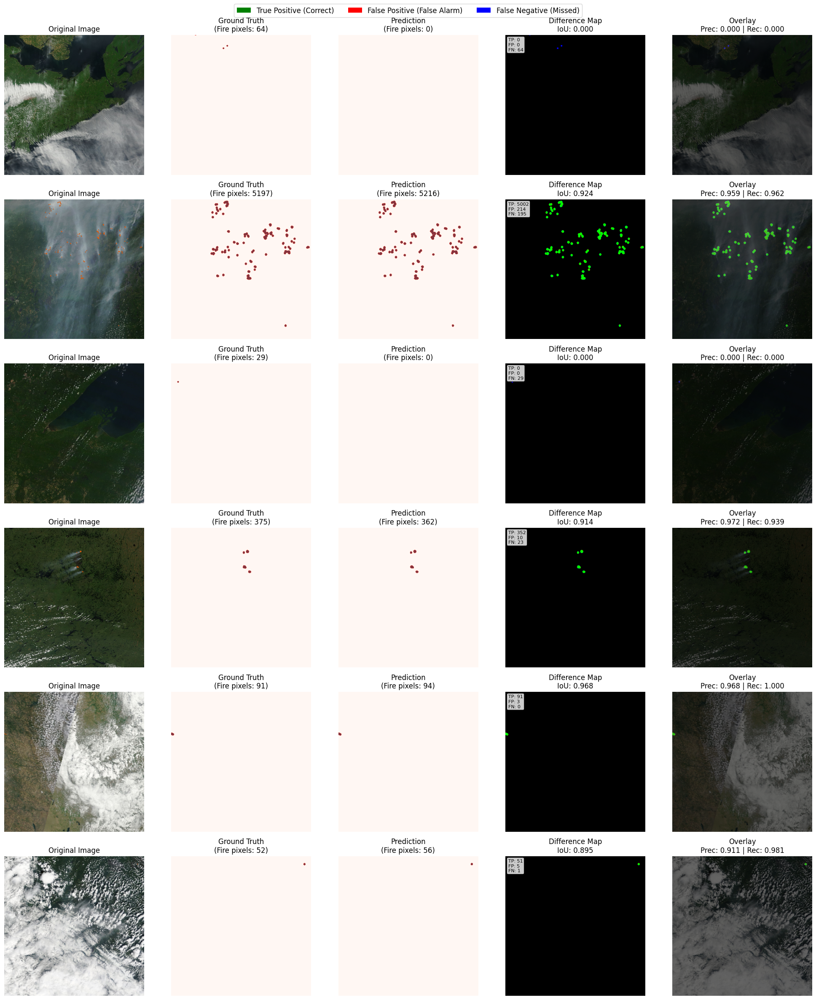


Summary Statistics:
Average IoU: 0.8947
Average Precision: 0.9107
Average Recall: 0.9808

2. Missing Predictions Analysis


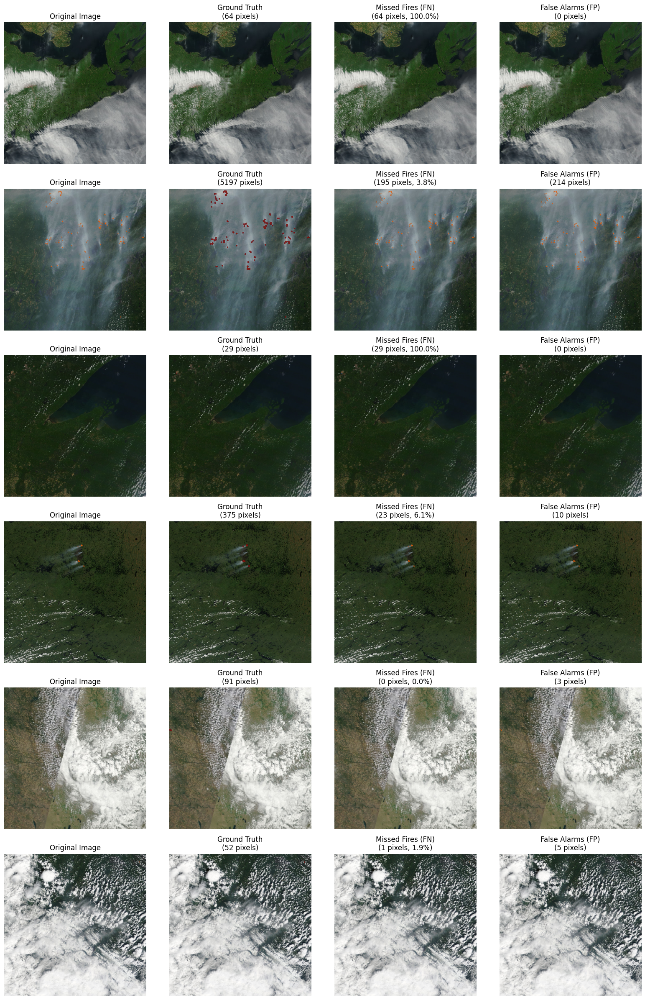


Validation Set Analysis:


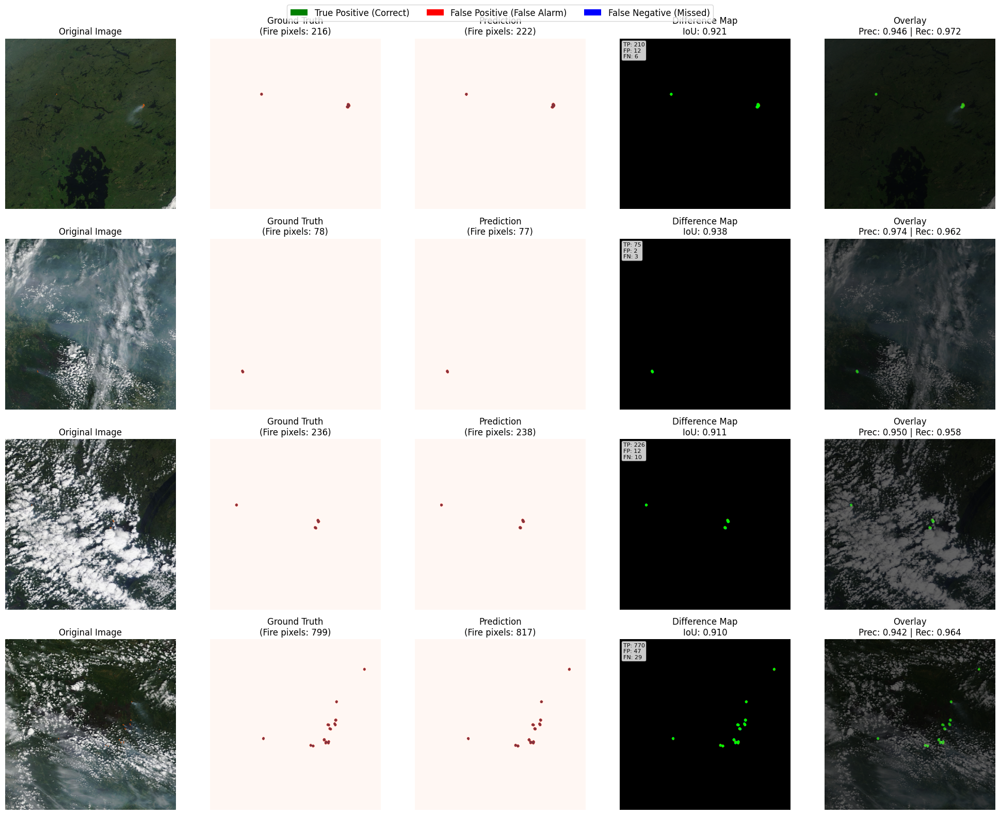


Summary Statistics:
Average IoU: 0.9102
Average Precision: 0.9425
Average Recall: 0.9637


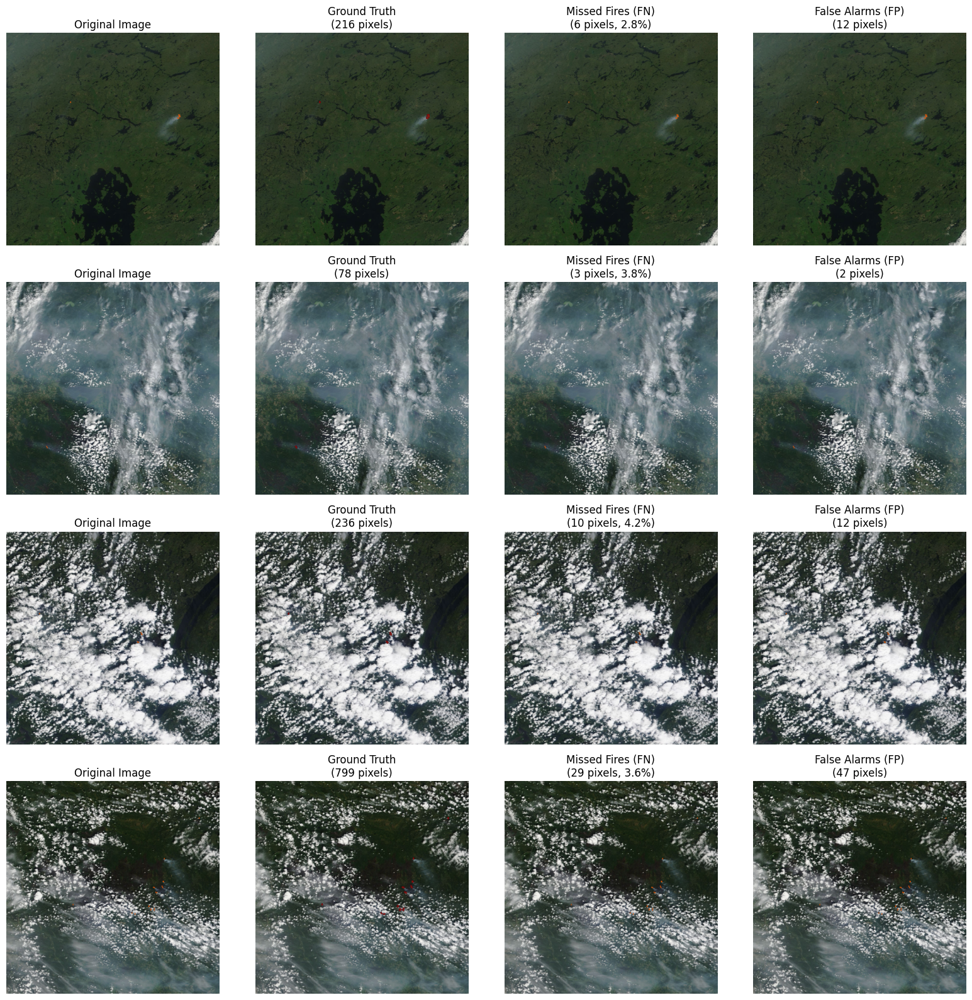

In [8]:
def visualize_prediction_differences(model, data_loader, num_samples=6, threshold=0.5):
    """
    Visualize the differences between ground truth and predictions.
    Shows:
    - True Positives (TP): Correctly predicted fire pixels (Green)
    - False Positives (FP): Incorrectly predicted as fire (Red)
    - False Negatives (FN): Missed fire pixels (Blue)
    - True Negatives (TN): Correctly predicted as non-fire (Black/Dark)
    """
    batch = next(iter(data_loader))
    results = predict_batch(model, batch, threshold)
    
    images = results['images']
    masks = results['masks']
    preds = results['predictions']
    probs = results['probs']
    
    num_samples = min(num_samples, len(images))
    
    fig, axes = plt.subplots(num_samples, 5, figsize=(20, 4*num_samples))
    if num_samples == 1:
        axes = axes.reshape(1, -1)
    
    for i in range(num_samples):
        # Denormalize image
        img = denormalize_image(images[i]).permute(1, 2, 0).numpy()
        
        # Get masks
        gt_mask = masks[i].squeeze().numpy() if masks[i].dim() > 2 else masks[i].numpy()
        pred_mask = preds[i].squeeze().numpy() if preds[i].dim() > 2 else preds[i].numpy()
        prob_map = probs[i].squeeze().numpy() if probs[i].dim() > 2 else probs[i].numpy()
        
        # Convert to binary
        gt_binary = (gt_mask > 0.5).astype(np.uint8)
        pred_binary = (pred_mask > 0.5).astype(np.uint8)
        
        # Calculate components
        true_positive = (gt_binary == 1) & (pred_binary == 1)
        false_positive = (gt_binary == 0) & (pred_binary == 1)
        false_negative = (gt_binary == 1) & (pred_binary == 0)
        true_negative = (gt_binary == 0) & (pred_binary == 0)
        
        # Create difference visualization (RGB)
        diff_viz = np.zeros((*gt_binary.shape, 3))
        diff_viz[true_positive] = [0, 1, 0]      # Green: Correct detections
        diff_viz[false_positive] = [1, 0, 0]     # Red: False alarms
        diff_viz[false_negative] = [0, 0, 1]     # Blue: Missed fires
        # True negatives stay black
        
        # Calculate metrics for this sample
        tp_count = true_positive.sum()
        fp_count = false_positive.sum()
        fn_count = false_negative.sum()
        
        iou = tp_count / (tp_count + fp_count + fn_count) if (tp_count + fp_count + fn_count) > 0 else 0
        precision = tp_count / (tp_count + fp_count) if (tp_count + fp_count) > 0 else 0
        recall = tp_count / (tp_count + fn_count) if (tp_count + fn_count) > 0 else 0
        
        # 1. Original Image
        axes[i, 0].imshow(img)
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')
        
        # 2. Ground Truth
        axes[i, 1].imshow(gt_mask, cmap='Reds', alpha=0.8)
        axes[i, 1].set_title(f'Ground Truth\n(Fire pixels: {gt_binary.sum()})')
        axes[i, 1].axis('off')
        
        # 3. Prediction
        axes[i, 2].imshow(pred_mask, cmap='Reds', alpha=0.8)
        axes[i, 2].set_title(f'Prediction\n(Fire pixels: {pred_binary.sum()})')
        axes[i, 2].axis('off')
        
        # 4. Difference Map
        axes[i, 3].imshow(diff_viz)
        axes[i, 3].set_title(f'Difference Map\nIoU: {iou:.3f}')
        axes[i, 3].axis('off')
        
        # Add legend text
        legend_text = f'TP: {tp_count}\nFP: {fp_count}\nFN: {fn_count}'
        axes[i, 3].text(0.02, 0.98, legend_text, 
                       transform=axes[i, 3].transAxes,
                       verticalalignment='top',
                       bbox=dict(boxstyle='round', facecolor='white', alpha=0.8),
                       fontsize=8)
        
        # 5. Overlay on Original
        axes[i, 4].imshow(img)
        axes[i, 4].imshow(diff_viz, alpha=0.6)
        axes[i, 4].set_title(f'Overlay\nPrec: {precision:.3f} | Rec: {recall:.3f}')
        axes[i, 4].axis('off')
    
    # Add main legend
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor='green', label='True Positive (Correct)'),
        Patch(facecolor='red', label='False Positive (False Alarm)'),
        Patch(facecolor='blue', label='False Negative (Missed)')
    ]
    fig.legend(handles=legend_elements, loc='upper center', 
              bbox_to_anchor=(0.5, 0.99), ncol=3, fontsize=12)
    
    plt.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()
    
    # Print summary statistics
    print("\nSummary Statistics:")
    print(f"Average IoU: {iou:.4f}")
    print(f"Average Precision: {precision:.4f}")
    print(f"Average Recall: {recall:.4f}")


def visualize_missing_predictions(model, data_loader, num_samples=6, threshold=0.5):
    """
    Focused visualization showing only the missed fire regions.
    Highlights what the model failed to detect.
    """
    batch = next(iter(data_loader))
    results = predict_batch(model, batch, threshold)
    
    images = results['images']
    masks = results['masks']
    preds = results['predictions']
    
    num_samples = min(num_samples, len(images))
    
    fig, axes = plt.subplots(num_samples, 4, figsize=(16, 4*num_samples))
    if num_samples == 1:
        axes = axes.reshape(1, -1)
    
    for i in range(num_samples):
        img = denormalize_image(images[i]).permute(1, 2, 0).numpy()
        gt_mask = masks[i].squeeze().numpy() if masks[i].dim() > 2 else masks[i].numpy()
        pred_mask = preds[i].squeeze().numpy() if preds[i].dim() > 2 else preds[i].numpy()
        
        gt_binary = (gt_mask > 0.5).astype(np.uint8)
        pred_binary = (pred_mask > 0.5).astype(np.uint8)
        
        # Calculate missing predictions (False Negatives)
        missed = (gt_binary == 1) & (pred_binary == 0)
        extra = (gt_binary == 0) & (pred_binary == 1)
        correct = (gt_binary == 1) & (pred_binary == 1)
        
        missed_percentage = (missed.sum() / gt_binary.sum() * 100) if gt_binary.sum() > 0 else 0
        
        # 1. Original
        axes[i, 0].imshow(img)
        axes[i, 0].set_title('Original Image')
        axes[i, 0].axis('off')
        
        # 2. Ground Truth only
        axes[i, 1].imshow(img)
        axes[i, 1].imshow(np.ma.masked_where(gt_binary == 0, gt_binary), 
                         cmap='Reds', alpha=0.7, vmin=0, vmax=1)
        axes[i, 1].set_title(f'Ground Truth\n({gt_binary.sum()} pixels)')
        axes[i, 1].axis('off')
        
        # 3. Correctly Predicted (overlap removed)
        remaining_gt = gt_binary.copy()
        remaining_gt[correct] = 0  # Remove the overlap
        
        axes[i, 2].imshow(img)
        axes[i, 2].imshow(np.ma.masked_where(remaining_gt == 0, remaining_gt), 
                         cmap='Blues', alpha=0.7, vmin=0, vmax=1)
        axes[i, 2].set_title(f'Missed Fires (FN)\n({missed.sum()} pixels, {missed_percentage:.1f}%)')
        axes[i, 2].axis('off')
        
        # 4. False Alarms
        axes[i, 3].imshow(img)
        axes[i, 3].imshow(np.ma.masked_where(extra == 0, extra), 
                         cmap='Oranges', alpha=0.7, vmin=0, vmax=1)
        axes[i, 3].set_title(f'False Alarms (FP)\n({extra.sum()} pixels)')
        axes[i, 3].axis('off')
    
    plt.tight_layout()
    plt.show()


# Run the new visualizations
print("\n" + "="*50)
print("DIFFERENCE ANALYSIS VISUALIZATIONS")
print("="*50)

print("\n1. Detailed Difference Map (TP/FP/FN)")
visualize_prediction_differences(model, test_loader, num_samples=6, threshold=0.5)

print("\n2. Missing Predictions Analysis")
visualize_missing_predictions(model, test_loader, num_samples=6, threshold=0.5)

print("\nValidation Set Analysis:")
visualize_prediction_differences(model, val_loader, num_samples=4, threshold=0.5)
visualize_missing_predictions(model, val_loader, num_samples=4, threshold=0.5)

In [9]:
# ## 7. Performance Summary

print("\n" + "="*50)
print("FINAL PERFORMANCE SUMMARY")
print("="*50)

# Create summary DataFrame
summary_data = {
    'Dataset': ['Test', 'Validation'],
    'Fire F1': [test_metrics.get('fire_f1', 0), val_metrics.get('fire_f1', 0)],
    'Mean IoU': [test_metrics.get('mean_iou', 0), val_metrics.get('mean_iou', 0)],
    'Precision': [test_metrics.get('fire_precision', 0), val_metrics.get('fire_precision', 0)],
    'Recall': [test_metrics.get('fire_detection_rate', 0), val_metrics.get('fire_detection_rate', 0)],
    
}

summary_df = pd.DataFrame(summary_data)
print(summary_df.round(4))

# Class distribution analysis
print(f"\nClass Distribution Analysis:")
test_fire_ratio = np.mean(test_targets)
val_fire_ratio = np.mean(val_targets)
print(f"Test set fire pixel ratio: {test_fire_ratio:.4f} ({test_fire_ratio*100:.2f}%)")
print(f"Validation set fire pixel ratio: {val_fire_ratio:.4f} ({val_fire_ratio*100:.2f}%)")

print(f"\nModel is ready for Phase 2 (ConvLSTM) development!")
print(f"Current model achieves {test_metrics.get('fire_f1', 0):.1%} F1 score on test data.")

print("\n" + "="*50)
print("ANALYSIS COMPLETE")
print("="*50)


FINAL PERFORMANCE SUMMARY
      Dataset  Fire F1  Mean IoU  Precision  Recall
0        Test   0.9580    0.9194     0.9587  0.9573
1  Validation   0.9589    0.9211     0.9623  0.9555

Class Distribution Analysis:
Test set fire pixel ratio: 0.0028 (0.28%)
Validation set fire pixel ratio: 0.0027 (0.27%)

Model is ready for Phase 2 (ConvLSTM) development!
Current model achieves 95.8% F1 score on test data.

ANALYSIS COMPLETE
